# Imports

In [3]:
import pandas as pd
import numpy as np
from collections import defaultdict


from sklearn.preprocessing import StandardScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis


import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.decomposition import PCA





# Import data 

In [4]:
x_train = pd.read_csv('human+activity+recognition+using+smartphones/UCI HAR Dataset/train/X_train.txt',
    sep=r"\s+",  
    header=None)



FileNotFoundError: [Errno 2] No such file or directory: 'human+activity+recognition+using+smartphones/UCI HAR Dataset/train/X_train.txt'

In [175]:
x_train = pd.read_csv('human+activity+recognition+using+smartphones/UCI HAR Dataset/train/X_train.txt',
    sep=r"\s+",  
    header=None)

print(x_train.shape)
display(x_train.head())
x_train.columns.is_unique

(7352, 561)


,0,1,2,3,4,5,6,7,8,9,...,551,552,553,554,555,556,557,558,559,560
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,-0.074323,-0.298676,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,0.158075,-0.595051,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,0.414503,-0.390748,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118
3,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,...,0.404573,-0.117290,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663
4,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,...,0.087753,-0.351471,-0.699205,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892


True

In [176]:
y_train = pd.read_csv('human+activity+recognition+using+smartphones/UCI HAR Dataset/train/y_train.txt',
    sep=r"\s+", 
    header=None,
    names=["activity"])

print(y_train.shape)

(7352, 1)


In [126]:
x_train.describe()

,0,1,2,3,4,5,6,7,8,9,...,551,552,553,554,555,556,557,558,559,560
count,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,...,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000,7352.000000
mean,0.274488,-0.017695,-0.109141,-0.605438,-0.510938,-0.604754,-0.630512,-0.526907,-0.606150,-0.468604,...,0.125293,-0.307009,-0.625294,0.008684,0.002186,0.008726,-0.005981,-0.489547,0.058593,-0.056515
std,0.070261,0.040811,0.056635,0.448734,0.502645,0.418687,0.424073,0.485942,0.414122,0.544547,...,0.250994,0.321011,0.307584,0.336787,0.448306,0.608303,0.477975,0.511807,0.297480,0.279122
min,-1.000000,-1.000000,-1.000000,-1.000000,-0.999873,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,-1.000000,-0.995357,-0.999765,-0.976580,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000
25%,0.262975,-0.024863,-0.120993,-0.992754,-0.978129,-0.980233,-0.993591,-0.978162,-0.980251,-0.936219,...,-0.023692,-0.542602,-0.845573,-0.121527,-0.289549,-0.482273,-0.376341,-0.812065,-0.017885,-0.143414
50%,0.277193,-0.017219,-0.108676,-0.946196,-0.851897,-0.859365,-0.950709,-0.857328,-0.857143,-0.881637,...,0.134000,-0.343685,-0.711692,0.009509,0.008943,0.008735,-0.000368,-0.709417,0.182071,0.003181
75%,0.288461,-0.010783,-0.097794,-0.242813,-0.034231,-0.262415,-0.292680,-0.066701,-0.265671,-0.017129,...,0.289096,-0.126979,-0.503878,0.150865,0.292861,0.506187,0.359368,-0.509079,0.248353,0.107659
max,1.000000,1.000000,1.000000,1.000000,0.916238,1.000000,1.000000,0.967664,1.000000,1.000000,...,0.946700,0.989538,0.956845,1.000000,1.000000,0.998702,0.996078,1.000000,0.478157,1.000000


In [127]:
print('Min and max values')
print(x_train.min().min())
print(x_train.max().max())


Min and max values
-1.0
1.0


In [1]:
x_train.isna

NameError: name 'x_train' is not defined

#### Il dataset è già stato normalizzato [-1,1]

In [128]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

x_tr_scaled = scaler.fit_transform(x_train)

# Convert to DataFrame so we can use describe()
x_tr_scaled_df = pd.DataFrame(
    x_tr_scaled,
    columns=x_train.columns
)


original_df = pd.DataFrame(
    x_train,
    columns=x_train.columns
)

comparison = pd.DataFrame({
    "Original": [
        original_df.mean().mean(),
        original_df.std().mean(),
        original_df.min().mean(),
        original_df.max().mean(),
        original_df.min().min(),
        original_df.max().max(),
    ],
    "Standardized": [
        x_tr_scaled_df.mean().mean(),
        x_tr_scaled_df.std().mean(),
        x_tr_scaled_df.min().mean(),
        x_tr_scaled_df.max().mean(),
        x_tr_scaled_df.min().min(),
        x_tr_scaled_df.max().max(),
    ]
}, index=[
    "Mean of feature means",
    "Mean of feature stds",
    "Mean of feature minima",
    "Mean of feature maxima",
    "Min value",
    "Max value"
])

comparison

,Original,Standardized
Mean of feature means,-0.508365,1.200648e-17
Mean of feature stds,0.283693,1.000068e+00
Mean of feature minima,-0.990303,-1.782175e+00
Mean of feature maxima,0.978355,7.327683e+00
Min value,-1.000000,-2.407152e+01
Max value,1.000000,3.419406e+01


### Calcoliamo la deviazione standard delle feature

In [171]:
feature_std = x_train.std()

print(feature_std.describe())
print("Min std:", feature_std.min())
print("Max std:", feature_std.max())


count    561.000000
mean       0.283693
std        0.137054
min        0.040811
25%        0.191581
50%        0.265434
75%        0.362455
max        0.751733
dtype: float64
Min std: 0.040810524573263486
Max std: 0.7517328950472323
Ratio: 18.420074304551353


### Dato che σmax >> σmin proveremo ad applicare la standardizzazione anche nella fase di riduzione della dimensionalità, sebbene il dataset sia già stato normalizzato."

## Import features names

In [ ]:
features = pd.read_csv('human+activity+recognition+using+smartphones/UCI HAR Dataset/features.txt',
    sep=r"\s+",  
    header=None)


# estrarre le features names per creare una lista

features_names = features.iloc[:, 1].to_list()   


### Check delle features names: 

Ci sono dei duplicati ? Dalle 561 nomi di features, solo 477 sono nomi unici.

In [133]:
print('Shape training data:')
print(x_train.shape)

print('Totale features:')
print(len(features_names))


print('Totale nomi unici di feature:')
print(len(set(features_names)))


Shape training data:
(7352, 561)
Totale features:
561
Totale nomi unici di feature:
477


### Check dati duplicati

#### 90 features hanno lo stesso nome, i valori nelle colonne si repetono ?

In [134]:
positions = defaultdict(list)

for i, name in enumerate(features_names):
    positions[name].append(i)

duplicates = {
    name: idxs
    for name, idxs in positions.items()
    if len(idxs) > 1
}

for name, idxs in list(duplicates.items())[:5]:
    print(name, idxs)

    for i in range(len(idxs) - 1):
        print(
            x_train.iloc[:, idxs[i]].equals(
                x_train.iloc[:, idxs[i + 1]]
            )
        )

fBodyAcc-bandsEnergy()-1,8 [302, 316, 330]
False
False
fBodyAcc-bandsEnergy()-9,16 [303, 317, 331]
False
False
fBodyAcc-bandsEnergy()-17,24 [304, 318, 332]
False
False
fBodyAcc-bandsEnergy()-25,32 [305, 319, 333]
False
False
fBodyAcc-bandsEnergy()-33,40 [306, 320, 334]
False
False


## Modifica dei nomi delle feature

#### Sono presenti nomi di variabili duplicati, ma i dati nelle colonne corrispondenti non sono identici, modificheremo solo i nomi delle feature

In [135]:
feature_names_unique = [
f"{i + 1}_{name}" 
for i, name in enumerate(features_names)
]

x_train.columns = feature_names_unique
print(x_train.shape)
display(x_train.head())

(7352, 561)


,1_tBodyAcc-mean()-X,2_tBodyAcc-mean()-Y,3_tBodyAcc-mean()-Z,4_tBodyAcc-std()-X,5_tBodyAcc-std()-Y,6_tBodyAcc-std()-Z,7_tBodyAcc-mad()-X,8_tBodyAcc-mad()-Y,9_tBodyAcc-mad()-Z,10_tBodyAcc-max()-X,...,552_fBodyBodyGyroJerkMag-meanFreq(),553_fBodyBodyGyroJerkMag-skewness(),554_fBodyBodyGyroJerkMag-kurtosis(),"555_angle(tBodyAccMean,gravity)","556_angle(tBodyAccJerkMean),gravityMean)","557_angle(tBodyGyroMean,gravityMean)","558_angle(tBodyGyroJerkMean,gravityMean)","559_angle(X,gravityMean)","560_angle(Y,gravityMean)","561_angle(Z,gravityMean)"
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,-0.074323,-0.298676,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,0.158075,-0.595051,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,0.414503,-0.390748,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118
3,0.279174,-0.026201,-0.123283,-0.996091,-0.983403,-0.990675,-0.997099,-0.982750,-0.989302,-0.938692,...,0.404573,-0.117290,-0.482845,-0.036788,-0.012892,0.640011,-0.485366,-0.848649,0.181935,-0.047663
4,0.276629,-0.016570,-0.115362,-0.998139,-0.980817,-0.990482,-0.998321,-0.979672,-0.990441,-0.942469,...,0.087753,-0.351471,-0.699205,0.123320,0.122542,0.693578,-0.615971,-0.847865,0.185151,-0.043892


#### Dataframe train con variabile target

In [136]:
df_train = x_train.copy()

df_train["activity"] = y_train["activity"]
print(df_train.shape)
display(df_train.head(3))

(7352, 562)


,1_tBodyAcc-mean()-X,2_tBodyAcc-mean()-Y,3_tBodyAcc-mean()-Z,4_tBodyAcc-std()-X,5_tBodyAcc-std()-Y,6_tBodyAcc-std()-Z,7_tBodyAcc-mad()-X,8_tBodyAcc-mad()-Y,9_tBodyAcc-mad()-Z,10_tBodyAcc-max()-X,...,553_fBodyBodyGyroJerkMag-skewness(),554_fBodyBodyGyroJerkMag-kurtosis(),"555_angle(tBodyAccMean,gravity)","556_angle(tBodyAccJerkMean),gravityMean)","557_angle(tBodyGyroMean,gravityMean)","558_angle(tBodyGyroJerkMean,gravityMean)","559_angle(X,gravityMean)","560_angle(Y,gravityMean)","561_angle(Z,gravityMean)",activity
0,0.288585,-0.020294,-0.132905,-0.995279,-0.983111,-0.913526,-0.995112,-0.983185,-0.923527,-0.934724,...,-0.298676,-0.710304,-0.112754,0.030400,-0.464761,-0.018446,-0.841247,0.179941,-0.058627,5
1,0.278419,-0.016411,-0.123520,-0.998245,-0.975300,-0.960322,-0.998807,-0.974914,-0.957686,-0.943068,...,-0.595051,-0.861499,0.053477,-0.007435,-0.732626,0.703511,-0.844788,0.180289,-0.054317,5
2,0.279653,-0.019467,-0.113462,-0.995380,-0.967187,-0.978944,-0.996520,-0.963668,-0.977469,-0.938692,...,-0.390748,-0.760104,-0.118559,0.177899,0.100699,0.808529,-0.848933,0.180637,-0.049118,5


## Analisi della distribuzione delle classi




### Train set

Distribuzione delle classi (%)
activity
6    19.137650
5    18.688792
4    17.491839
1    16.675734
2    14.594668
3    13.411317
Name: proportion, dtype: float64


Describe della distribuzione classi (%)
count     6.000000
mean     16.666667
std       2.270076
min      13.411317
25%      15.114935
50%      17.083787
75%      18.389554
max      19.137650
Name: proportion, dtype: float64


Plot distribuzione delle classi


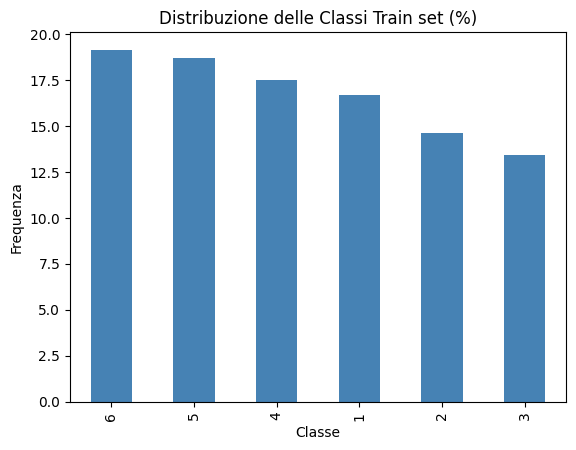

In [51]:
# Numero di istanze per ciascuna classe

counts_per_class = df_train['activity'].value_counts(normalize=True)*100

print("Distribuzione delle classi (%)")
print(counts_per_class)
print('\n')
print("Describe della distribuzione classi (%)")
print(counts_per_class.describe())

print('\n')
print('Plot distribuzione delle classi')

(df_train['activity'].value_counts(normalize=True)*100).plot(kind='bar', color='steelblue')
plt.title('Distribuzione delle Classi Train set (%)')
plt.xlabel('Classe')
plt.ylabel('Frequenza')
plt.show()

#### Le classi sono abbastanza bilanciate, con un minimo pari a 13.41% per la classe 3 e un massimo di 19.14% raggiunto dalla classe 6, diviazione standard uguale a 2,27 %.

### Test set 

In [52]:
y_test = pd.read_csv('/Users/agustindei/Documents/Master_unipa/verifica_ml_dl/human+activity+recognition+using+smartphones/UCI HAR Dataset/test/y_test.txt',
    sep=r"\s+",  
    header=None,
    names=["activity"])

print(y_test.shape)

(2947, 1)


Distribuzione delle Test set (%)
activity
6    18.221921
5    18.052257
1    16.830675
4    16.661011
2    15.982355
3    14.251781
Name: proportion, dtype: float64


Describe della distribuzione Test set (%)
count     6.000000
mean     16.666667
std       1.460518
min      14.251781
25%      16.152019
50%      16.745843
75%      17.746861
max      18.221921
Name: proportion, dtype: float64


Plot distribuzione delle classi


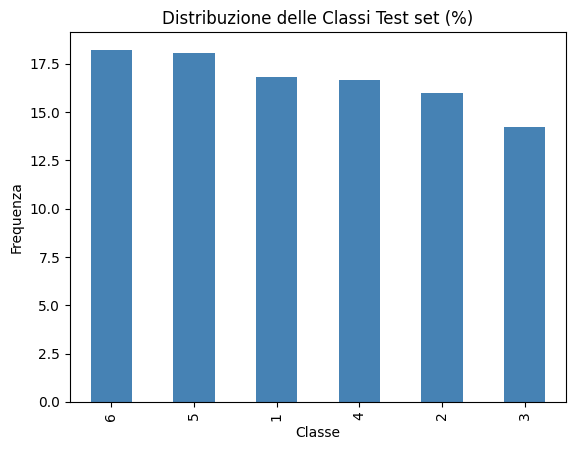

In [53]:
# Numero di istanze per ciascuna classe

counts_per_class = y_test['activity'].value_counts(normalize=True)*100

print("Distribuzione delle Test set (%)")
print(counts_per_class)
print('\n')
print("Describe della distribuzione Test set (%)")
print(counts_per_class.describe())

print('\n')
print('Plot distribuzione delle classi')

(y_test['activity'].value_counts(normalize=True)*100).plot(kind='bar', color='steelblue')
plt.title('Distribuzione delle Classi Test set (%)')
plt.xlabel('Classe')
plt.ylabel('Frequenza')
plt.show()

Anche nel Test Set le classi risultano abbastanza bilanciate e in linea con il train set, con una percentuale minima del 14,25% per la classe 3 e una percentuale massima del 18,22% per la classe 6 e una deviazione standard è pari all'1,46%, indicando una variabilità contenuta nella distribuzione delle classi.


## PAIR PLOT

- Mostra le **distribuzioni** e le **relazioni tra le variabili**.

 **Diagonale:** mostra la distribuzione di ciascuna feature.

 **Fuori dalla diagonale:** mostra le relazioni tra le diverse feature.

### Problema

Abbiamo **troppe feature**, quindi non è possibile creare un *pairplot* che includa tutte le feature. Inoltre, creare diversi grafici suddividendo le feature in gruppi non rappresenta una soluzione ideale.


Esempio con le prime venti features:

In [54]:
features_to_plot = feature_names_unique[:20]

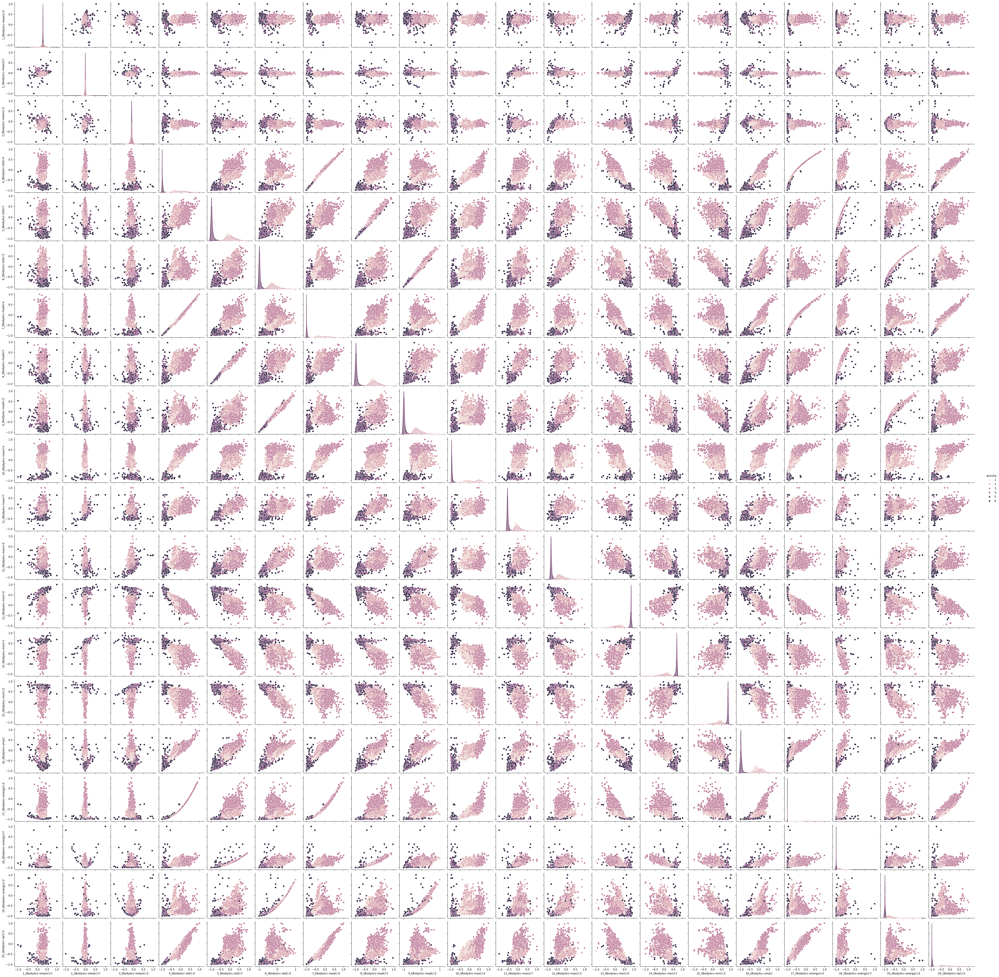

In [55]:
features_to_plot = feature_names_unique[:20]

sns.pairplot(df_train[features_to_plot + ['activity']], hue='activity') #, palette=['red', 'green', 'blue'])"""

## Matrice di correlazione



In [137]:
corr_matrix = x_train.corr()

corr_matrix.shape

(561, 561)

### Numero di coppie di feature ad alta correlazione

In [ ]:
corr_pairs = []

for i in range(len(corr_matrix.columns)):
    for j in range(i + 1, len(corr_matrix.columns)):
        corr_pairs.append(corr_matrix.iloc[i, j])

corr_pairs = np.array(corr_pairs)

print('total pairs in correlation matrix')
print(corr_pairs.shape[0])

print("|r| >= 0.90:", (np.abs(corr_pairs) > 0.90).sum())
print("|r| >= 0.95:", (np.abs(corr_pairs) > 0.95).sum())
print("|r| >= 0.99:", (np.abs(corr_pairs) > 0.99).sum())


count_090 = (np.abs(corr_pairs) >= 0.90).sum()

# Calcolo della percentuale
percentage_090 = (count_090 / corr_pairs.shape[0]) * 100


print(f'proporzione delle coppie con correlazion >= 0.90: {percentage_090:.2f}')


total pairs in correlation matrix
157080
|r| >= 0.90: 8206
|r| >= 0.95: 2281
|r| >= 0.99: 207
proporzione delle coppie con correlazion >= 0.95: 5.22


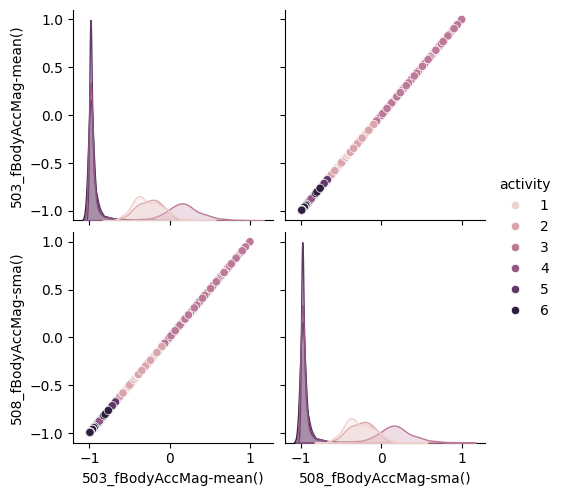

In [57]:
features_to_plot = ['503_fBodyAccMag-mean()',
                    '508_fBodyAccMag-sma()']
sns.pairplot(df_train[features_to_plot + ['activity']], hue='activity') 



Entrambe le caratteristiche separano individualmente le attività in modo molto simile, ma includerle entrambe non fornisce praticamente alcuna informazione aggiuntiva perché sono perfettamente correlate.



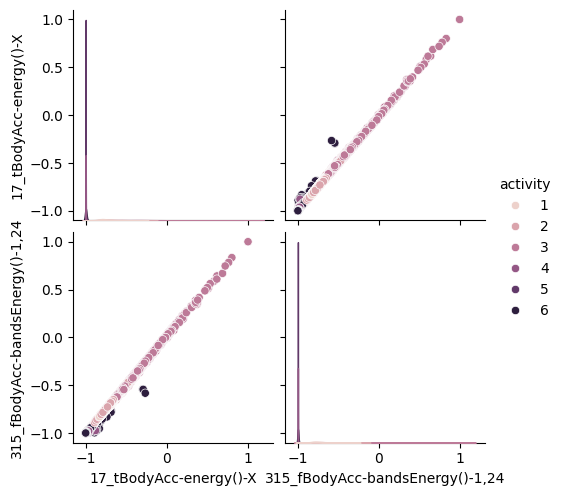

In [58]:
features_to_plot = ['17_tBodyAcc-energy()-X',
                    '315_fBodyAcc-bandsEnergy()-1,24']

sns.pairplot(df_train[features_to_plot + ['activity']], hue='activity') #, palette=['red', 'green', 'blue'])



- La distribuzione delle variabili è fortemente concentrata, piuttosto che gaussiana, osserviamo una sovrapposizione vicino a -1.
- La correlazione non è pari a 1 come nel primo esempio: alcune osservazioni con etichette 5 e 6 si distaccano dalla relazione lineare tra le due variabili.

### Heat map

A causa dell'elevato numero di feature, la visualizzazione non risulta del tutto efficace. Tuttavia, la **heatmap** conferma la presenza di feature **fortemente correlate tra loro**, con coefficienti di correlazione prossimi a 1.



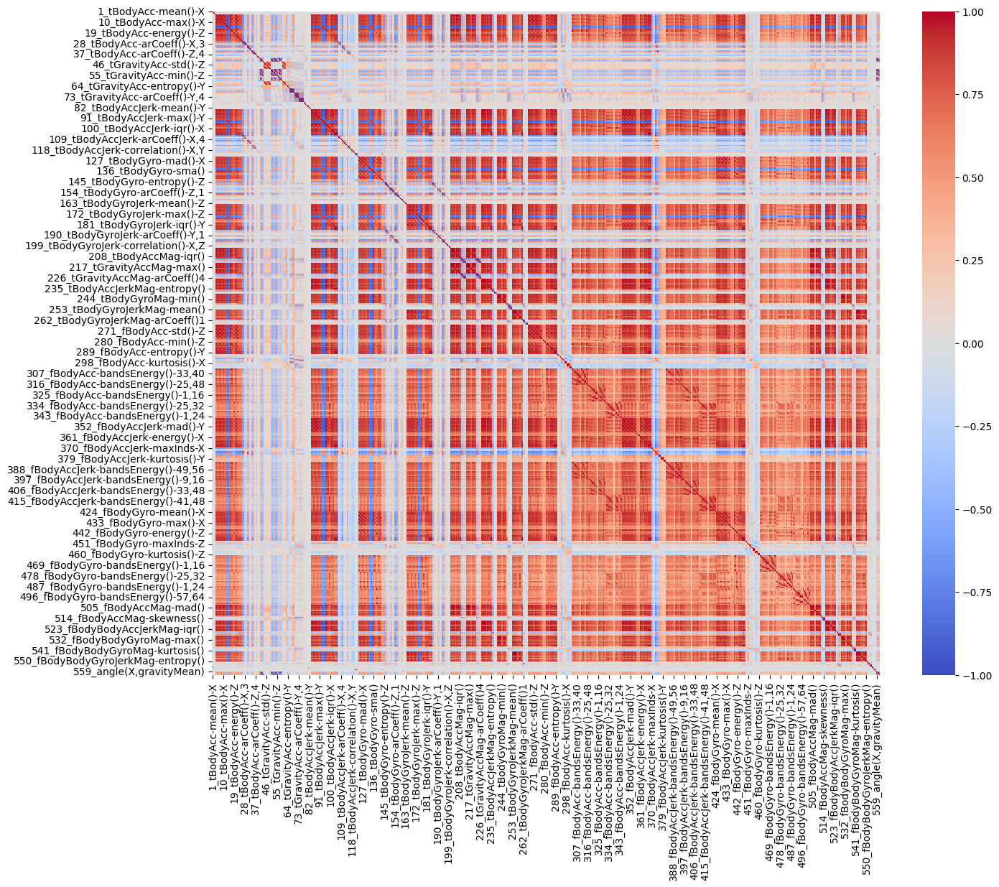

In [61]:
plt.figure(figsize=(15, 12))
sns.heatmap(
    corr_matrix,
    cmap="coolwarm",
    center=0,
    vmin=-1,
    vmax=1
)
plt.show()

Se consideriamo una correlazione superiore a **0,95**, sono presenti **2281 coppie di variabili fortemente correlate**, che possono risultare ridondanti e contribuire all'introduzione di rumore durante l'addestramento di un classificatore di **Machine Learning (ML)** o **Deep Learning (DL)**.

### Riduzione della dimensionalità

Si procede quindi con una **riduzione della dimensionalità del dataset**, con l'obiettivo di **ridurre la ridondanza tra le feature** e mantenere le informazioni maggiormente rilevanti.

## Riduzione della dimensionalità 

PCA e LDA

### PCA (no standardization) 

- Applichiamo PCA su x_train
- Calcoliamo la varianza cumulativa a seconda del numero di componenti per identificare una soglia.

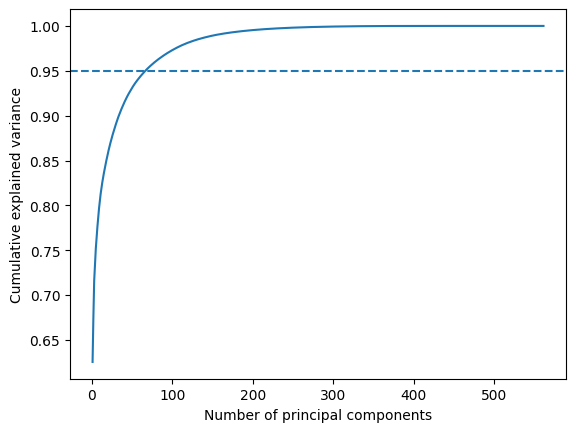

In [147]:
pca = PCA()
pca.fit(x_train)

cumulative_variance = np.cumsum(
    pca.explained_variance_ratio_
)

plt.plot(
    range(1, len(cumulative_variance) + 1),
    cumulative_variance
)

plt.xlabel("Number of principal components")
plt.ylabel("Cumulative explained variance")
plt.axhline(0.95, linestyle="--")
plt.show()

In [152]:
for soglia in [0.80, 0.85, 0.90, 0.95, 0.97, 0.99]:
    n_components = np.argmax(cumulative_variance >= soglia) + 1
    print('soglia di varianza --> numero di componenti')
    print(f'{soglia} --> {n_components}')

soglia di varianza --> numero di componenti
0.8 --> 10
soglia di varianza --> numero di componenti
0.85 --> 19
soglia di varianza --> numero di componenti
0.9 --> 34
soglia di varianza --> numero di componenti
0.95 --> 67
soglia di varianza --> numero di componenti
0.97 --> 95
soglia di varianza --> numero di componenti
0.99 --> 155


### StandardScaler + PCA

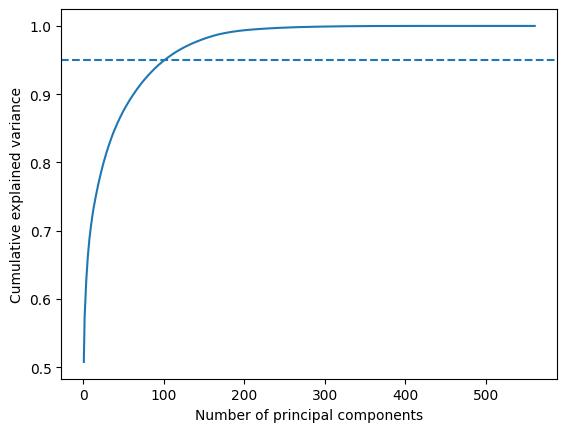

In [149]:
scaler = StandardScaler()

X_train_std = scaler.fit_transform(x_train)

pca_std = PCA()

pca_std.fit(X_train_std)

cumulative_variance_std = np.cumsum(
    pca_std.explained_variance_ratio_
)

plt.plot(
    range(1, len(cumulative_variance_std) + 1),
    cumulative_variance_std
)

plt.xlabel("Number of principal components")
plt.ylabel("Cumulative explained variance")
plt.axhline(0.95, linestyle="--")
plt.show()

In [151]:
for soglia in [0.80, 0.85, 0.90, 0.95, 0.97, 0.99]:
    n_components = np.argmax(cumulative_variance_std >= soglia) + 1
    print('soglia di varianza --> numero di componenti')
    print(f'{soglia} --> {n_components}')

soglia di varianza --> numero di componenti
0.8 --> 26
soglia di varianza --> numero di componenti
0.85 --> 40
soglia di varianza --> numero di componenti
0.9 --> 63
soglia di varianza --> numero di componenti
0.95 --> 102
soglia di varianza --> numero di componenti
0.97 --> 128
soglia di varianza --> numero di componenti
0.99 --> 179


Riusciamo a catturare 0.95 della varianza del dataset originale di 561 features con 67 componenti se applichiamo la pca sul dataset normalizzato e con 102 componenti se applichiamo la pca sul dataset normalizzato e standardadizzato.

### Visualizzazioni

#### Plot PCA 3 components - 3D


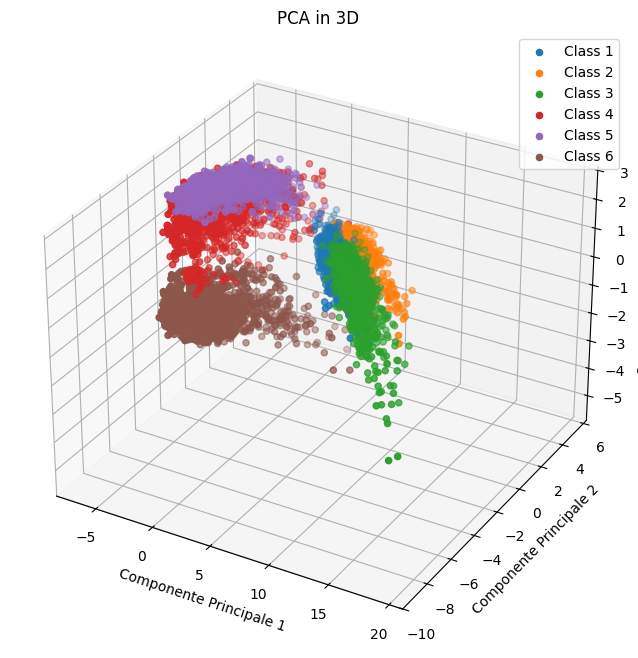

In [67]:
pca = PCA(n_components=3)
X_pca = pca.fit_transform(x_train)

pca_df = pd.DataFrame(X_pca, columns=['Componente Principale 1', 'Componente Principale 2', 'Componente Principale 3'])

# Labels 
y = df_train['activity']
pca_df['activity'] = y


# plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
for label in np.unique(y):
    ax.scatter(X_pca[y == label, 0], X_pca[y == label, 1], X_pca[y == label, 2], label=f'Class {label}')
ax.set_xlabel('Componente Principale 1')
ax.set_ylabel('Componente Principale 2')
ax.set_zlabel('Componente Principale 3')
ax.set_title('PCA in 3D')
ax.legend()
plt.show()

La rappresentazione delle tre componenti principali mediante PCA suggerisce:
- una parziale separazione tra le sei classi. 
- la classe 6 sembra occupare una regione distinta nello spazio delle componenti principali,
- altre classi (1-2-3 e 4-5) evidenziano una significativa sovrapposizione,
- ricordiamo che la PCA non tiene conto della separazione delle classi.



### Plot PCA

#### 2 components - 2D

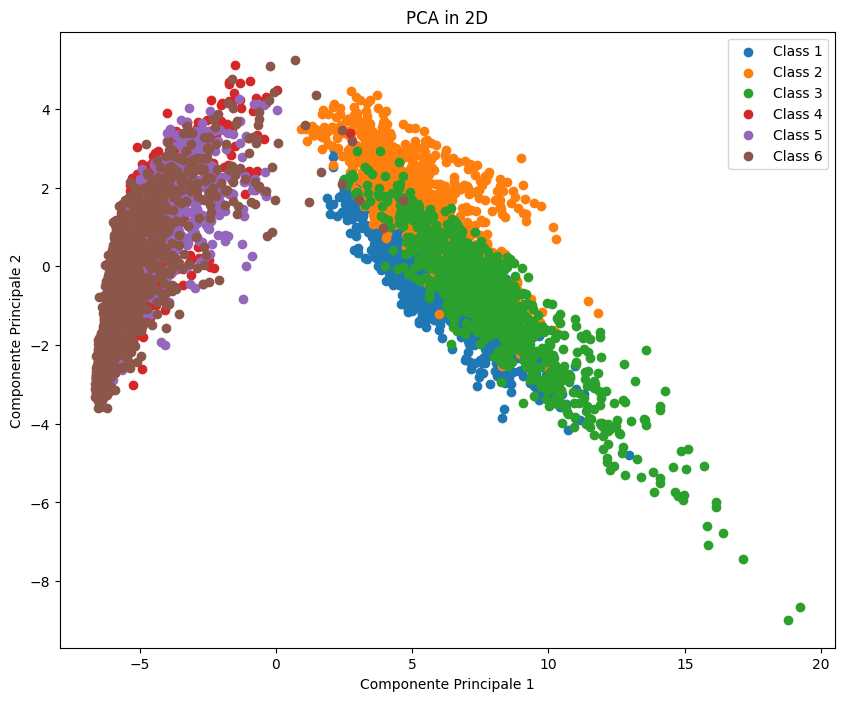

In [70]:

pca = PCA(n_components=2)
X_pca = pca.fit_transform(x_train)

pca_df = pd.DataFrame(X_pca, columns=['Componente Principale 1', 'Componente Principale 2'])

# colonna delle etichette
y = df_train['activity']
pca_df['activity'] = y


fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111)
for label in np.unique(y):
    ax.scatter(X_pca[y == label, 0], X_pca[y == label, 1], label=f'Class {label}')
ax.set_xlabel('Componente Principale 1')
ax.set_ylabel('Componente Principale 2')
ax.set_title('PCA in 2D')
ax.legend()
plt.show()

### LDA


Il metodo LDA, a differenza della PCA che è non supervisionato, LDA tiene conto delle classi e dunque cerca a massimizzare le differenze tra le classi e a ridurre la dispersione intra-classe. PCA, invece, massimizza la varianza del dataset senza tener conto delle classi.


In [159]:
lda = LinearDiscriminantAnalysis()    


y = df_train['activity']
x_lda = lda.fit_transform(x_train, y)


print(x_lda.shape)
print(len(lda.explained_variance_ratio_))
print(lda.explained_variance_ratio_)
cumulative_variance = np.cumsum(lda.explained_variance_ratio_)

print("Cumulative explained variance:")
print(cumulative_variance)


(7352, 5)
5
[0.73179996 0.17624642 0.05461643 0.02824873 0.00908846]
Cumulative explained variance:
[0.73179996 0.90804638 0.96266281 0.99091154 1.        ]


In [163]:
lda.explained_variance_ratio_

array([0.73179996, 0.17624642, 0.05461643, 0.02824873, 0.00908846])

Stardard Scaler + LDA

In [ ]:
lda = LinearDiscriminantAnalysis()    

y = df_train['activity']
x_lda = lda.fit_transform(X_train_std, y)


print(x_lda.shape)
print(len(lda.explained_variance_ratio_))
print(lda.explained_variance_ratio_)
cumulative_variance = np.cumsum(lda.explained_variance_ratio_)

print("Cumulative explained variance:")
print(cumulative_variance)
#print(lda.feature_names_in_)

(7352, 5)
5
[0.73179996 0.17624642 0.05461643 0.02824873 0.00908846]
Cumulative explained variance:
[0.73179996 0.90804638 0.96266281 0.99091154 1.        ]


##### La standardizzazione non modifica i risultati della LDA poiché la LDA si basa sulla variazione tra le classi rispetto alla variazione interna alle classi. La PCA, al contrario, massimizza la varianza.

#### Conclusioni LDA: 

- explained_variance_ratio_ in LDA mostra l'informazione discriminante relativa associata a ciascuna direzione discriminante.

- Le prime 2 dimensioni della LDA contengono la maggior parte dell'informazioni discriminanti: [0.73179996 0.17624642 0.05461643 0.02824873 0.
00908846]

- Vis

## Visualizzazione LDA 3 prime componenti

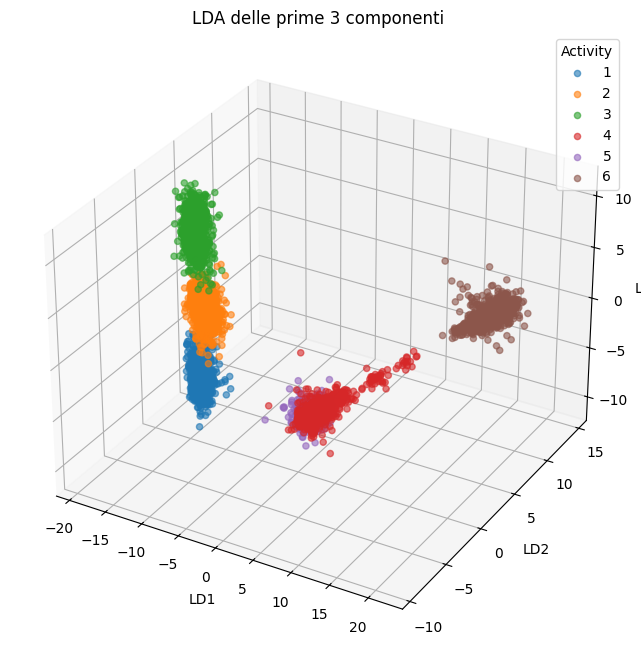

In [167]:
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

for activity in np.unique(y):
    mask = (y == activity)

    ax.scatter(
        x_lda[mask, 0],   # LD1
        x_lda[mask, 1],   # LD2
        x_lda[mask, 2],   # LD3
        label=activity,
        alpha=0.6,
        s=20
    )

ax.set_xlabel('LD1')
ax.set_ylabel('LD2')
ax.set_zlabel('LD3')

ax.set_title('LDA delle prime 3 componenti')
ax.legend(title='Activity')

plt.show()